<a href="https://colab.research.google.com/github/SSR-ds/Time-Series-with-Python/blob/main/Data_Prep_for_Sequence_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px
%matplotlib inline

import os
from keras.preprocessing.sequence import TimeseriesGenerator
from IPython.display import Image, display 

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from datetime import datetime
import seaborn as sns   

In [1]:
from google.colab import files
uploaded = files.upload()

Saving energydata_complete.csv to energydata_complete.csv


In [108]:
df1 = pd.read_csv('energydata_complete.csv')

In [109]:
df1.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [110]:
df1.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [111]:
df1.dtypes

date            object
Appliances       int64
lights           int64
T1             float64
RH_1           float64
T2             float64
RH_2           float64
T3             float64
RH_3           float64
T4             float64
RH_4           float64
T5             float64
RH_5           float64
T6             float64
RH_6           float64
T7             float64
RH_7           float64
T8             float64
RH_8           float64
T9             float64
RH_9           float64
T_out          float64
Press_mm_hg    float64
RH_out         float64
Windspeed      float64
Visibility     float64
Tdewpoint      float64
rv1            float64
rv2            float64
dtype: object

In [112]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [113]:
df1[['date','T_out','RH_5','Appliances','lights','Tdewpoint']]

,date,T_out,RH_5,Appliances,lights,Tdewpoint
0,2016-01-11 17:00:00,6.600000e+00,55.200000,60,30,5.300000e+00
1,2016-01-11 17:10:00,6.483333e+00,55.200000,60,30,5.200000e+00
2,2016-01-11 17:20:00,6.366667e+00,55.090000,50,30,5.100000e+00
3,2016-01-11 17:30:00,6.250000e+00,55.090000,50,40,5.000000e+00
4,2016-01-11 17:40:00,6.133333e+00,55.090000,60,40,4.900000e+00
5,2016-01-11 17:50:00,6.016667e+00,55.030000,50,40,4.800000e+00
6,2016-01-11 18:00:00,5.900000e+00,54.966667,60,50,4.700000e+00
7,2016-01-11 18:10:00,5.916667e+00,54.900000,60,50,4.683333e+00
8,2016-01-11 18:20:00,5.933333e+00,55.000000,60,40,4.666667e+00
9,2016-01-11 18:30:00,5.950000e+00,55.000000,70,40,4.650000e+00


In [114]:
df1['date'] = pd.to_datetime(df1['date'], infer_datetime_format=True)

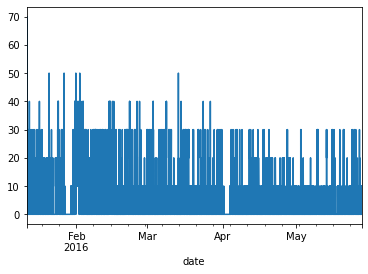

In [115]:
df1.set_index('date')['lights'].plot()

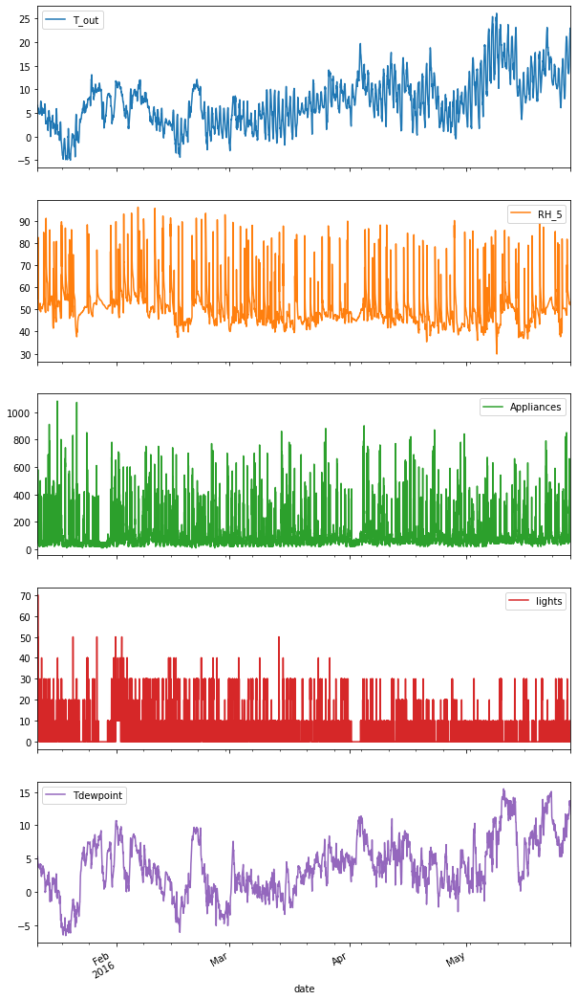

In [116]:
df1.set_index('date')[['T_out','RH_5','Appliances','lights','Tdewpoint']].plot(subplots=True,figsize=(10,20));

In [117]:
features = df1[['Appliances','RH_5','T_out','Tdewpoint','lights']].to_numpy().tolist()
target = df1['Appliances'].tolist()

In [118]:
features[0:20]

[[60.0, 55.2, 6.6, 5.3, 30.0],
 [60.0, 55.2, 6.48333333333333, 5.2, 30.0],
 [50.0, 55.09, 6.36666666666667, 5.1, 30.0],
 [50.0, 55.09, 6.25, 5.0, 40.0],
 [60.0, 55.09, 6.133333333333329, 4.9, 40.0],
 [50.0, 55.03, 6.01666666666667, 4.8, 40.0],
 [60.0, 54.9666666666667, 5.9, 4.7, 50.0],
 [60.0, 54.9, 5.91666666666667, 4.68333333333333, 50.0],
 [60.0, 55.0, 5.93333333333333, 4.66666666666667, 40.0],
 [70.0, 55.0, 5.95, 4.65, 40.0],
 [230.0, 55.0, 5.96666666666667, 4.633333333333329, 70.0],
 [580.0, 55.0, 5.98333333333333, 4.61666666666667, 60.0],
 [430.0, 55.09, 6.0, 4.6, 50.0],
 [250.0, 55.1633333333333, 6.0, 4.51666666666667, 40.0],
 [100.0, 55.5, 6.0, 4.43333333333333, 10.0],
 [100.0, 56.0425, 6.0, 4.35, 10.0],
 [90.0, 56.49, 6.0, 4.26666666666667, 10.0],
 [70.0, 56.9333333333333, 6.0, 4.18333333333333, 30.0],
 [80.0, 57.06, 6.0, 4.1, 30.0],
 [140.0, 70.7266666666667, 6.0, 4.06666666666667, 40.0]]

In [119]:
target[0:20]

[60,
 60,
 50,
 50,
 60,
 50,
 60,
 60,
 60,
 70,
 230,
 580,
 430,
 250,
 100,
 100,
 90,
 70,
 80,
 140]

In [122]:
time_series_generator = TimeseriesGenerator(features,target,length=6, sampling_rate=1, batch_size=2)

In [123]:
time_series_generator[0]

(array([[[60.        , 55.2       ,  6.6       ,  5.3       ,
          30.        ],
         [60.        , 55.2       ,  6.48333333,  5.2       ,
          30.        ],
         [50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ]],
 
        [[60.        , 55.2       ,  6.48333333,  5.2       ,
          30.        ],
         [50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ],
         [60.        , 54.96666667,  5.9       ,  4

In [88]:
time_series_generator[1]

(array([[[50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ],
         [60.        , 54.96666667,  5.9       ,  4.7       ,
          50.        ],
         [60.        , 54.9       ,  5.91666667,  4.68333333,
          50.        ]],
 
        [[50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ],
         [60.        , 54.96666667,  5.9       ,  4.7       ,
          50.        ],
         [60.        , 54.9       ,  5.91666667,  4.68333333,
          50.        ],
         [60.        , 55.        ,  5.93333333,  4

In [89]:
len(time_series_generator)

9865

In [90]:
time_series_generator = TimeseriesGenerator(features,target,length=6, sampling_rate=1, batch_size=2, stride=2)

In [91]:
len(time_series_generator)

4933

In [92]:
time_series_generator[0]

(array([[[60.        , 55.2       ,  6.6       ,  5.3       ,
          30.        ],
         [60.        , 55.2       ,  6.48333333,  5.2       ,
          30.        ],
         [50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ]],
 
        [[50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ],
         [60.        , 54.96666667,  5.9       ,  4.7       ,
          50.        ],
         [60.        , 54.9       ,  5.91666667,  4

In [93]:
time_series_generator[1]

(array([[[ 60.        ,  55.09      ,   6.13333333,   4.9       ,
           40.        ],
         [ 50.        ,  55.03      ,   6.01666667,   4.8       ,
           40.        ],
         [ 60.        ,  54.96666667,   5.9       ,   4.7       ,
           50.        ],
         [ 60.        ,  54.9       ,   5.91666667,   4.68333333,
           50.        ],
         [ 60.        ,  55.        ,   5.93333333,   4.66666667,
           40.        ],
         [ 70.        ,  55.        ,   5.95      ,   4.65      ,
           40.        ]],
 
        [[ 60.        ,  54.96666667,   5.9       ,   4.7       ,
           50.        ],
         [ 60.        ,  54.9       ,   5.91666667,   4.68333333,
           50.        ],
         [ 60.        ,  55.        ,   5.93333333,   4.66666667,
           40.        ],
         [ 70.        ,  55.        ,   5.95      ,   4.65      ,
           40.        ],
         [230.        ,  55.        ,   5.96666667,   4.63333333,
           70.       

In [95]:
pd.concat([df1['Appliances'], df1['Appliances'].shift(-1), df1['Appliances'].shift(-2)], axis=1).head(50)

,Appliances,Appliances,Appliances
0,60,60.0,50.0
1,60,50.0,50.0
2,50,50.0,60.0
3,50,60.0,50.0
4,60,50.0,60.0
5,50,60.0,60.0
6,60,60.0,60.0
7,60,60.0,70.0
8,60,70.0,230.0
9,70,230.0,580.0


In [100]:
m_target = pd.concat([df1['Appliances'], df1['Appliances'].shift(-1), df1['Appliances'].shift(-2)], axis=1).dropna().to_numpy().tolist()

In [101]:
m_target[0:20]

[[60.0, 60.0, 50.0],
 [60.0, 50.0, 50.0],
 [50.0, 50.0, 60.0],
 [50.0, 60.0, 50.0],
 [60.0, 50.0, 60.0],
 [50.0, 60.0, 60.0],
 [60.0, 60.0, 60.0],
 [60.0, 60.0, 70.0],
 [60.0, 70.0, 230.0],
 [70.0, 230.0, 580.0],
 [230.0, 580.0, 430.0],
 [580.0, 430.0, 250.0],
 [430.0, 250.0, 100.0],
 [250.0, 100.0, 100.0],
 [100.0, 100.0, 90.0],
 [100.0, 90.0, 70.0],
 [90.0, 70.0, 80.0],
 [70.0, 80.0, 140.0],
 [80.0, 140.0, 120.0],
 [140.0, 120.0, 190.0]]

In [124]:
time_series_generator2 = TimeseriesGenerator(features[:-2],m_target,length=6, sampling_rate=1, batch_size=1, stride=6)

In [125]:
time_series_generator2[0]

(array([[[60.        , 55.2       ,  6.6       ,  5.3       ,
          30.        ],
         [60.        , 55.2       ,  6.48333333,  5.2       ,
          30.        ],
         [50.        , 55.09      ,  6.36666667,  5.1       ,
          30.        ],
         [50.        , 55.09      ,  6.25      ,  5.        ,
          40.        ],
         [60.        , 55.09      ,  6.13333333,  4.9       ,
          40.        ],
         [50.        , 55.03      ,  6.01666667,  4.8       ,
          40.        ]]]), array([[60., 60., 60.]]))

In [126]:
time_series_generator2[1]

(array([[[ 60.        ,  54.96666667,   5.9       ,   4.7       ,
           50.        ],
         [ 60.        ,  54.9       ,   5.91666667,   4.68333333,
           50.        ],
         [ 60.        ,  55.        ,   5.93333333,   4.66666667,
           40.        ],
         [ 70.        ,  55.        ,   5.95      ,   4.65      ,
           40.        ],
         [230.        ,  55.        ,   5.96666667,   4.63333333,
           70.        ],
         [580.        ,  55.        ,   5.98333333,   4.61666667,
           60.        ]]]), array([[430., 250., 100.]]))